In [1]:
!pip install 'zarr<3'

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [2]:
# ALWAYS RUN THIS FIRST!
import os
import sys
from pathlib import Path

NOTEBOOK_DIR = Path("/rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p")
os.chdir(NOTEBOOK_DIR)
sys.path.insert(0, str(NOTEBOOK_DIR))

print(f"✅ Working directory: {os.getcwd()}")

✅ Working directory: /rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p


In [3]:
# Cell 1: Import necessary libraries
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import logging
from PIL import Image

# Import your model
from models import HEOnlyUNet

# Import the new inference module
from inference import WSIInference

# Setup logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger("WSI_Inference_Demo")

print("✅ All imports successful!")

/usr/local/lib/python3.11/dist-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


✅ All imports successful!


## Cell 2: Load Your Trained Model

In [4]:
# Cell 2: Load the trained HE-only model
checkpoint_path = 'checkpoints/best_he_only_model.pth'

# Check if checkpoint exists
if not Path(checkpoint_path).exists():
    raise FileNotFoundError(f"Checkpoint not found at {checkpoint_path}")

# Initialize model
model = HEOnlyUNet(backbone='resnet50', pretrained=False, dropout_rate=0.3)

# Load checkpoint
checkpoint = torch.load(checkpoint_path, map_location='cpu')
model.load_state_dict(checkpoint['model_state_dict'])

print(f"✅ Model loaded from {checkpoint_path}")
print(f"Epoch: {checkpoint.get('epoch', 'N/A')}")

# Handle best_loss safely
best_loss = checkpoint.get('best_loss', None)
if best_loss is not None:
    print(f"Best Loss: {best_loss:.4f}")
else:
    print("Best Loss: N/A")

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params:,}")

✅ Model loaded from checkpoints/best_he_only_model.pth
Epoch: 10
Best Loss: N/A
Total parameters: 120,270,534


## Cell 3: Setup WSI Inference

In [5]:
# Cell 3: Initialize WSI Inference
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Initialize inference engine
wsi_inference = WSIInference(
    model=model,
    device=device,
    patch_size=1024,        # Your patch size
    overlap=64,             # Overlap to handle boundary cells
    batch_size=4,           # Adjust based on GPU memory
    magnification=40,       # Your magnification level
    num_classes=6,          # Number of cell classes
    output_dir='outputs/wsi_inference',  # Where to save results
    logger=logger
)

print("✅ WSI Inference initialized!")

Using device: cuda:0


INFO:WSI_Inference_Demo:Initialized WSI Inference on cuda:0
INFO:WSI_Inference_Demo:Patch size: 1024, Overlap: 64
INFO:WSI_Inference_Demo:Batch size: 4, Magnification: 40


✅ WSI Inference initialized!


## Cell 4: Load a Test WSI

Loading WSI from: /rsrch9/home/plm/idso_fa1_pathology/TIER1/yasin-vitaminp/Xenium_public/5k/breast/Xenium_Prime_Breast_Cancer_FFPE_he_image_registered.ome.tif
Full WSI shape: (74945, 51265, 3)
Full WSI dtype: uint8

Reading 1024x1024 chunk from (24000, 30000)...

Chunk shape: (1024, 1024, 3)
Chunk dtype: uint8
Chunk value range: [0, 255]


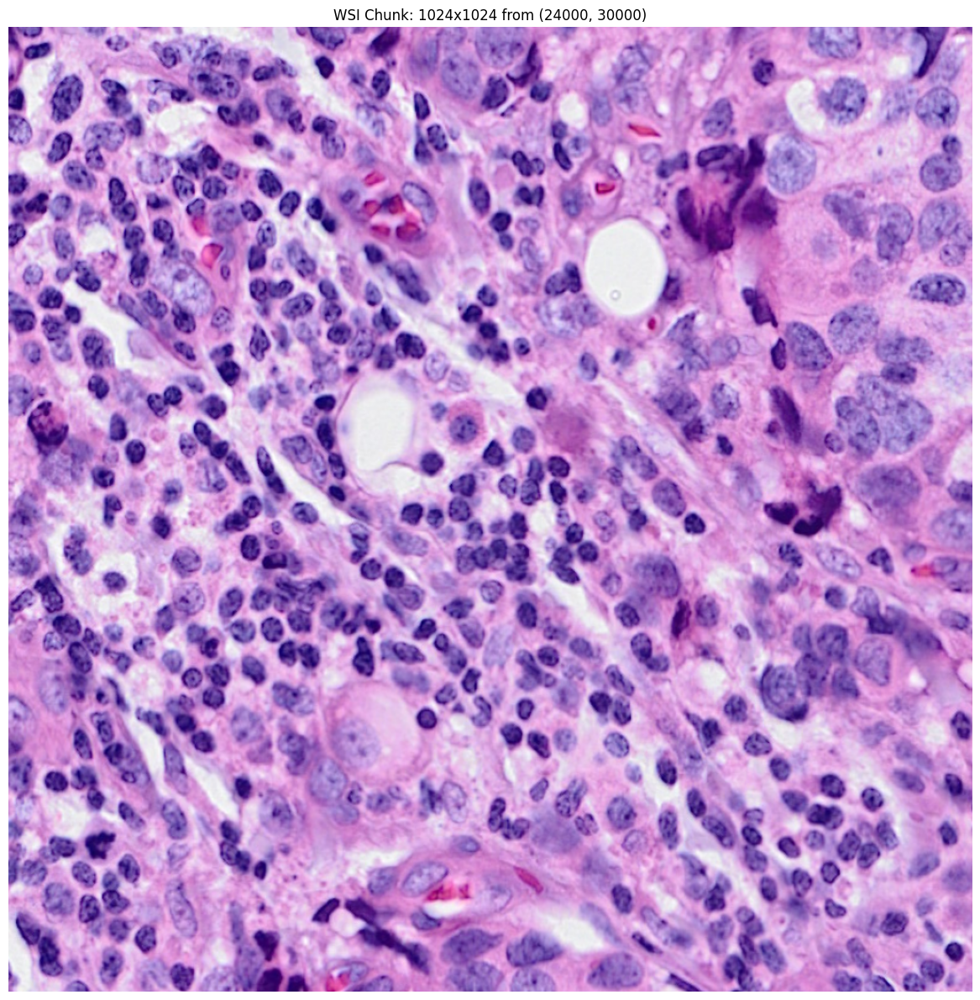

✅ Real WSI chunk loaded!
Final shape: (1024, 1024, 3)
Final dtype: uint8


In [33]:
# Cell 4: Load a real WSI chunk from OME-TIFF file
import tifffile

# Path to your OME-TIFF file
wsi_path = '/rsrch9/home/plm/idso_fa1_pathology/TIER1/yasin-vitaminp/Xenium_public/5k/breast/Xenium_Prime_Breast_Cancer_FFPE_he_image_registered.ome.tif'

print(f"Loading WSI from: {wsi_path}")

# Open the OME-TIFF file
with tifffile.TiffFile(wsi_path) as tif:
    # Get the first page (highest resolution)
    page = tif.pages[0]
    
    print(f"Full WSI shape: {page.shape}")
    print(f"Full WSI dtype: {page.dtype}")
    
    # Define chunk coordinates (top-left corner)
    chunk_size = 1024
    start_y = 24000  # Starting Y coordinate
    start_x = 30000  # Starting X coordinate
    
    # Read a 5000x5000 chunk
    print(f"\nReading {chunk_size}x{chunk_size} chunk from ({start_y}, {start_x})...")
    wsi_array = page.asarray()[start_y:start_y+chunk_size, start_x:start_x+chunk_size]
    
    # Handle different channel configurations
    if wsi_array.ndim == 2:
        # Grayscale - convert to RGB
        wsi_array = np.stack([wsi_array] * 3, axis=-1)
    elif wsi_array.shape[-1] > 3:
        # Take first 3 channels if more than 3
        wsi_array = wsi_array[..., :3]
    
    print(f"\nChunk shape: {wsi_array.shape}")
    print(f"Chunk dtype: {wsi_array.dtype}")
    print(f"Chunk value range: [{wsi_array.min()}, {wsi_array.max()}]")
    
    # Normalize to uint8 if needed
    if wsi_array.dtype != np.uint8:
        if wsi_array.max() <= 1.0:
            wsi_array = (wsi_array * 255).astype(np.uint8)
        else:
            wsi_array = wsi_array.astype(np.uint8)

# Visualize the chunk
plt.figure(figsize=(12, 12))
plt.imshow(wsi_array)
plt.title(f"WSI Chunk: {chunk_size}x{chunk_size} from ({start_y}, {start_x})")
plt.axis('off')
plt.tight_layout()
plt.show()

print("✅ Real WSI chunk loaded!")
print(f"Final shape: {wsi_array.shape}")
print(f"Final dtype: {wsi_array.dtype}")

## Cell 5: Run WSI Inference on Real Chunk

In [34]:
# Cell 5: Process the real WSI chunk for BOTH nuclei and cells
print("="*60)
print("RUNNING WSI INFERENCE ON REAL DATA")
print("="*60)

# ========== NUCLEI SEGMENTATION ==========
print("\n" + "="*50)
print("1. NUCLEI SEGMENTATION")
print("="*50)

results_nuclei = wsi_inference.process_wsi(
    wsi_array=wsi_array,
    wsi_name="CRC36_chunk_20k_30k_nuclei",
    modality="he",
    target="nuclei"
)

print(f"✅ Nuclei detected: {results_nuclei['num_cells']}")

# ========== CELL SEGMENTATION ==========
print("\n" + "="*50)
print("2. CELL SEGMENTATION")
print("="*50)

results_cells = wsi_inference.process_wsi(
    wsi_array=wsi_array,
    wsi_name="CRC36_chunk_20k_30k_cells",
    modality="he",
    target="cell"
)

print(f"✅ Cells detected: {results_cells['num_cells']}")

# ========== SUMMARY ==========
print("\n" + "="*60)
print("INFERENCE COMPLETE!")
print("="*60)
print(f"Total NUCLEI detected: {results_nuclei['num_cells']}")
print(f"Total CELLS detected:  {results_cells['num_cells']}")
print(f"Nuclei/Cell ratio:     {results_nuclei['num_cells'] / max(results_cells['num_cells'], 1):.2f}")

INFO:WSI_Inference_Demo:Processing WSI: CRC36_chunk_20k_30k_nuclei
INFO:WSI_Inference_Demo:WSI shape: (1024, 1024, 3)
INFO:WSI_Inference_Demo:Modality: he, Target: nuclei
INFO:WSI_Inference_Demo:Created patch grid: 1 rows x 1 cols = 1 patches


RUNNING WSI INFERENCE ON REAL DATA

1. NUCLEI SEGMENTATION


Processing patches: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]
INFO:WSI_Inference_Demo:Detected 761 cells before cleaning
INFO:WSI_Inference_Demo:Cleaning overlapping cells...
INFO:WSI_Inference_Demo:Initializing Overlap Cleaner
INFO:WSI_Inference_Demo:Finding edge cells for merging
INFO:WSI_Inference_Demo:Removing cells detected multiple times
INFO:WSI_Inference_Demo:Iteration 0: Found overlap of # cells: 0
INFO:WSI_Inference_Demo:Found all overlapping cells
INFO:WSI_Inference_Demo:Detected 761 cells after cleaning
INFO:WSI_Inference_Demo:Saved results to outputs/wsi_inference/CRC36_chunk_20k_30k_nuclei_results.json
INFO:WSI_Inference_Demo:Processing WSI: CRC36_chunk_20k_30k_cells
INFO:WSI_Inference_Demo:WSI shape: (1024, 1024, 3)
INFO:WSI_Inference_Demo:Modality: he, Target: cell
INFO:WSI_Inference_Demo:Created patch grid: 1 rows x 1 cols = 1 patches


✅ Nuclei detected: 761

2. CELL SEGMENTATION


Processing patches: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]
INFO:WSI_Inference_Demo:Detected 586 cells before cleaning
INFO:WSI_Inference_Demo:Cleaning overlapping cells...
INFO:WSI_Inference_Demo:Initializing Overlap Cleaner
INFO:WSI_Inference_Demo:Finding edge cells for merging
INFO:WSI_Inference_Demo:Removing cells detected multiple times
INFO:WSI_Inference_Demo:Iteration 0: Found overlap of # cells: 0
INFO:WSI_Inference_Demo:Found all overlapping cells
INFO:WSI_Inference_Demo:Detected 586 cells after cleaning
INFO:WSI_Inference_Demo:Saved results to outputs/wsi_inference/CRC36_chunk_20k_30k_cells_results.json


✅ Cells detected: 586

INFERENCE COMPLETE!
Total NUCLEI detected: 761
Total CELLS detected:  586
Nuclei/Cell ratio:     1.30


VISUALIZING NUCLEI AND CELLS
Drawing 761 objects...
Drawing 586 objects...


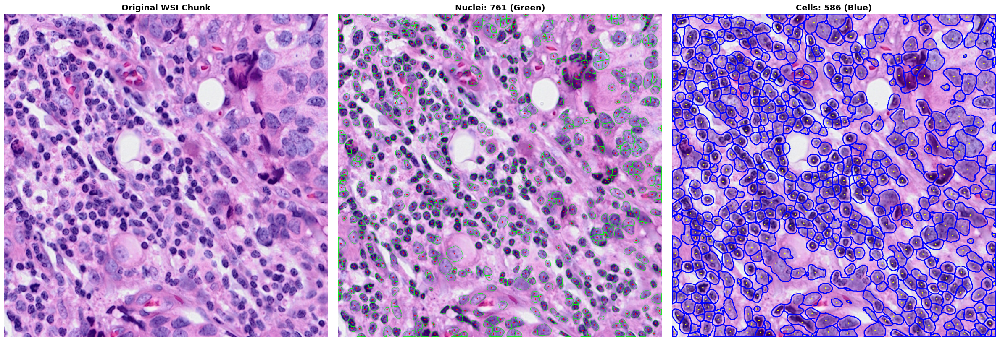


ZOOMED VIEW (Top-left 1500x1500)


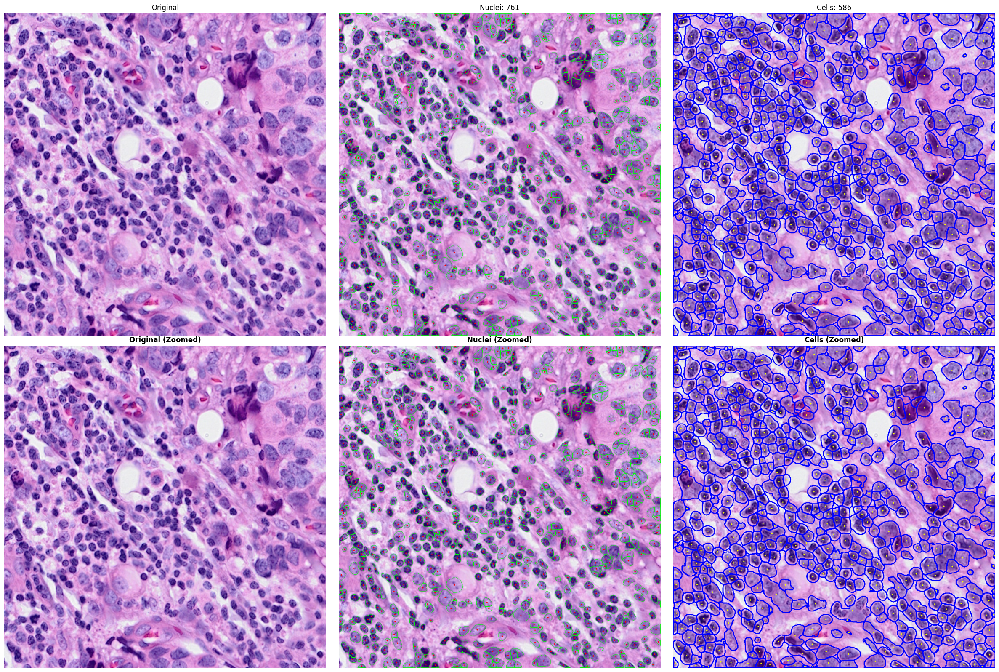


OVERLAY VIEW (Nuclei in Green + Cells in Blue)


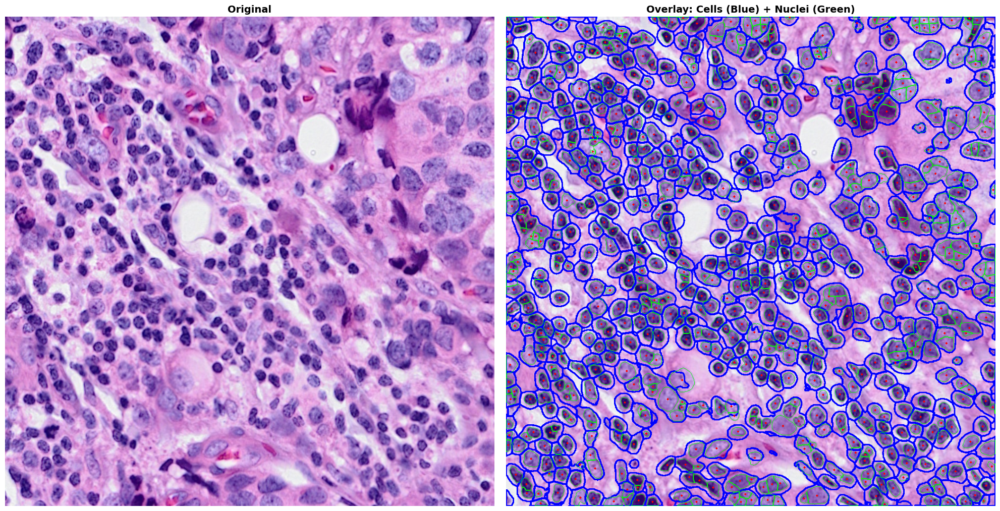


SUMMARY
✅ Nuclei visualized:  761 (Green contours, Red centroids)
✅ Cells visualized:   586 (Blue contours, Yellow centroids)
✅ Nuclei/Cell ratio:  1.30


In [35]:
# Cell 6: Visualize both nuclei and cells
import cv2

def visualize_detections(wsi_array, cells, max_cells_to_draw=None, 
                        draw_contours=True, draw_centroids=True,
                        contour_color=(0, 255, 0), centroid_color=(255, 0, 0),
                        contour_thickness=1):
    """Visualize detected cells on WSI"""
    # Create a copy for drawing
    vis_image = wsi_array.copy()
    
    # Determine how many cells to draw
    if max_cells_to_draw is None:
        cells_to_draw = cells
    else:
        cells_to_draw = cells[:max_cells_to_draw]
    
    print(f"Drawing {len(cells_to_draw)} objects...")
    
    for i, cell in enumerate(cells_to_draw):
        # Get contour and centroid
        contour = np.array(cell['contour'], dtype=np.int32)
        centroid = tuple(np.array(cell['centroid'], dtype=np.int32))
        
        # Draw contour
        if draw_contours and contour.shape[0] >= 3:
            cv2.drawContours(vis_image, [contour], -1, contour_color, contour_thickness)
        
        # Draw centroid
        if draw_centroids:
            cv2.circle(vis_image, centroid, 2, centroid_color, -1)
    
    return vis_image

# ========== VISUALIZE RESULTS ==========
print("="*60)
print("VISUALIZING NUCLEI AND CELLS")
print("="*60)

# Create visualizations
vis_nuclei = visualize_detections(
    wsi_array.copy(), 
    results_nuclei['cells'],
    draw_contours=True,
    draw_centroids=True,
    contour_color=(0, 255, 0),      # Green contours
    centroid_color=(255, 0, 0),     # Red centroids
    contour_thickness=1
)

vis_cells = visualize_detections(
    wsi_array.copy(), 
    results_cells['cells'],
    draw_contours=True,
    draw_centroids=True,
    contour_color=(0, 0, 255),      # Blue contours
    centroid_color=(255, 255, 0),   # Yellow centroids
    contour_thickness=2
)

# Display full image comparison
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

# Original
axes[0].imshow(wsi_array)
axes[0].set_title('Original WSI Chunk', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Nuclei
axes[1].imshow(vis_nuclei)
axes[1].set_title(f'Nuclei: {results_nuclei["num_cells"]} (Green)', fontsize=14, fontweight='bold')
axes[1].axis('off')

# Cells
axes[2].imshow(vis_cells)
axes[2].set_title(f'Cells: {results_cells["num_cells"]} (Blue)', fontsize=14, fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# ========== ZOOMED VIEW ==========
print("\n" + "="*60)
print("ZOOMED VIEW (Top-left 1500x1500)")
print("="*60)

zoom_size = 1500

fig, axes = plt.subplots(2, 3, figsize=(24, 16))

# Top row: Full context
axes[0, 0].imshow(wsi_array)
axes[0, 0].set_title('Original', fontsize=12)
axes[0, 0].axis('off')

axes[0, 1].imshow(vis_nuclei)
axes[0, 1].set_title(f'Nuclei: {results_nuclei["num_cells"]}', fontsize=12)
axes[0, 1].axis('off')

axes[0, 2].imshow(vis_cells)
axes[0, 2].set_title(f'Cells: {results_cells["num_cells"]}', fontsize=12)
axes[0, 2].axis('off')

# Bottom row: Zoomed
axes[1, 0].imshow(wsi_array[:zoom_size, :zoom_size])
axes[1, 0].set_title('Original (Zoomed)', fontsize=12, fontweight='bold')
axes[1, 0].axis('off')

axes[1, 1].imshow(vis_nuclei[:zoom_size, :zoom_size])
axes[1, 1].set_title('Nuclei (Zoomed)', fontsize=12, fontweight='bold')
axes[1, 1].axis('off')

axes[1, 2].imshow(vis_cells[:zoom_size, :zoom_size])
axes[1, 2].set_title('Cells (Zoomed)', fontsize=12, fontweight='bold')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# ========== OVERLAY VIEW (Nuclei + Cells together) ==========
print("\n" + "="*60)
print("OVERLAY VIEW (Nuclei in Green + Cells in Blue)")
print("="*60)

vis_overlay = wsi_array.copy()

# Draw cells first (blue, thicker)
for cell in results_cells['cells']:
    contour = np.array(cell['contour'], dtype=np.int32)
    if contour.shape[0] >= 3:
        cv2.drawContours(vis_overlay, [contour], -1, (0, 0, 255), 2)

# Draw nuclei on top (green, thinner)
for cell in results_nuclei['cells']:
    contour = np.array(cell['contour'], dtype=np.int32)
    centroid = tuple(np.array(cell['centroid'], dtype=np.int32))
    if contour.shape[0] >= 3:
        cv2.drawContours(vis_overlay, [contour], -1, (0, 255, 0), 1)
    cv2.circle(vis_overlay, centroid, 2, (255, 0, 0), -1)

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

axes[0].imshow(wsi_array)
axes[0].set_title('Original', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(vis_overlay)
axes[1].set_title(f'Overlay: Cells (Blue) + Nuclei (Green)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# ========== SUMMARY ==========
print("\n" + "="*60)
print("SUMMARY")
print("="*60)
print(f"✅ Nuclei visualized:  {results_nuclei['num_cells']} (Green contours, Red centroids)")
print(f"✅ Cells visualized:   {results_cells['num_cells']} (Blue contours, Yellow centroids)")
print(f"✅ Nuclei/Cell ratio:  {results_nuclei['num_cells'] / max(results_cells['num_cells'], 1):.2f}")

## WSI

In [ ]:
# Cell 7: Process ENTIRE WSI with final overlap cleaning
import tifffile
from tqdm import tqdm
import json

def process_entire_wsi_merged(
    wsi_path: str,
    wsi_inference: WSIInference,
    wsi_name: str,
    chunk_size: int = 10000,
    chunk_overlap: int = 512,  # Overlap between chunks for cleaning boundaries
    modality: str = "he",
    target: str = "nuclei",
    save_intermediate: bool = False
):
    """
    Process entire WSI by loading in chunks, then merge with overlap cleaning
    
    Args:
        wsi_path: Path to WSI file
        wsi_inference: WSIInference instance
        wsi_name: Name for saving results
        chunk_size: Size of chunks to process
        chunk_overlap: Overlap between chunks (for boundary cleaning)
        modality: 'he' or 'mif'
        target: 'nuclei' or 'cell'
        save_intermediate: Save each chunk result
    
    Returns:
        Dict with merged results for entire WSI
    """
    print("="*80)
    print(f"PROCESSING ENTIRE WSI: {wsi_name}")
    print(f"Target: {target.upper()}")
    print("="*80)
    
    # Open WSI and get dimensions
    with tifffile.TiffFile(wsi_path) as tif:
        page = tif.pages[0]
        wsi_height, wsi_width = page.shape[:2]
        
        print(f"\nWSI dimensions: {wsi_width:,} x {wsi_height:,} pixels")
        print(f"Chunk size: {chunk_size:,} x {chunk_size:,}")
        print(f"Chunk overlap: {chunk_overlap} pixels")
        
        # Calculate chunks with overlap
        stride = chunk_size - chunk_overlap
        n_chunks_y = int(np.ceil((wsi_height - chunk_overlap) / stride))
        n_chunks_x = int(np.ceil((wsi_width - chunk_overlap) / stride))
        total_chunks = n_chunks_y * n_chunks_x
        
        print(f"Total chunks: {n_chunks_y} x {n_chunks_x} = {total_chunks}")
        print(f"Estimated time: ~{total_chunks * 0.7:.1f} minutes\n")
        
        # Store all cells from all chunks
        all_cells = []
        
        # Process each chunk
        for chunk_y in tqdm(range(n_chunks_y), desc="Processing rows"):
            for chunk_x in range(n_chunks_x):
                # Calculate chunk coordinates
                y_start = chunk_y * stride
                x_start = chunk_x * stride
                y_end = min(y_start + chunk_size, wsi_height)
                x_end = min(x_start + chunk_size, wsi_width)
                
                actual_height = y_end - y_start
                actual_width = x_end - x_start
                
                # Read chunk
                chunk = page.asarray()[y_start:y_end, x_start:x_end]
                
                # Handle channels
                if chunk.ndim == 2:
                    chunk = np.stack([chunk] * 3, axis=-1)
                elif chunk.shape[-1] > 3:
                    chunk = chunk[..., :3]
                
                if chunk.dtype != np.uint8:
                    if chunk.max() <= 1.0:
                        chunk = (chunk * 255).astype(np.uint8)
                    else:
                        chunk = chunk.astype(np.uint8)
                
                # Process chunk
                try:
                    chunk_results = wsi_inference.process_wsi(
                        wsi_array=chunk,
                        wsi_name=f"{wsi_name}_{target}_chunk_{chunk_y}_{chunk_x}",
                        modality=modality,
                        target=target
                    )
                    
                    # Adjust coordinates to global WSI space
                    for cell in chunk_results['cells']:
                        # Adjust all coordinates
                        cell['centroid'] = cell['centroid'] + np.array([y_start, x_start])
                        cell['bbox'] = cell['bbox'] + np.array([[y_start, x_start], [y_start, x_start]])
                        cell['contour'] = cell['contour'] + np.array([x_start, y_start])
                        
                        # Store chunk information for debugging
                        cell['chunk_id'] = f"{chunk_y}_{chunk_x}"
                        cell['chunk_origin'] = [y_start, x_start]
                        cell['chunk_size'] = [actual_height, actual_width]
                    
                    all_cells.extend(chunk_results['cells'])
                    
                    # Save intermediate results if requested
                    if save_intermediate:
                        chunk_save_path = f"outputs/wsi_inference/chunks/{wsi_name}_{target}_chunk_{chunk_y}_{chunk_x}.json"
                        Path(chunk_save_path).parent.mkdir(exist_ok=True, parents=True)
                        with open(chunk_save_path, 'w') as f:
                            json.dump(chunk_results, f, default=str)
                
                except Exception as e:
                    print(f"\n⚠️ Error processing chunk [{chunk_y}, {chunk_x}]: {e}")
                    continue
        
        print(f"\n✅ All chunks processed!")
        print(f"Total cells before overlap cleaning: {len(all_cells):,}")
    
    # ========== CLEAN OVERLAPPING CELLS AT CHUNK BOUNDARIES ==========
    print("\n" + "="*80)
    print("CLEANING OVERLAPPING CELLS AT CHUNK BOUNDARIES")
    print("="*80)
    
    if len(all_cells) > 0:
        from inference.overlap_cleaner import OverlapCleaner
        
        cleaner = OverlapCleaner(all_cells, wsi_inference.logger)
        cleaned_df = cleaner.clean_detected_cells()
        cleaned_cells = cleaned_df.to_dict('records')
    else:
        cleaned_cells = []
    
    print(f"✅ Cells after cleaning: {len(cleaned_cells):,}")
    print(f"Removed {len(all_cells) - len(cleaned_cells):,} duplicate cells")
    
    # ========== FINAL RESULTS ==========
    final_results = {
        'cells': cleaned_cells,
        'num_cells': len(cleaned_cells),
        'wsi_metadata': {
            'name': wsi_name,
            'shape': (wsi_height, wsi_width, 3),
            'chunk_size': chunk_size,
            'chunk_overlap': chunk_overlap,
            'total_chunks': total_chunks,
            'modality': modality,
            'target': target,
            'wsi_path': wsi_path
        }
    }
    
    # Save final merged results
    output_path = f"outputs/wsi_inference/{wsi_name}_{target}_FULL_WSI.json"
    Path(output_path).parent.mkdir(exist_ok=True, parents=True)
    
    # Make serializable
    serializable_results = wsi_inference._make_serializable(final_results)
    
    with open(output_path, 'w') as f:
        json.dump(serializable_results, f, indent=2)
    
    print(f"\n💾 Saved final results to: {output_path}")
    
    return final_results


# ========== PROCESS ENTIRE WSI FOR NUCLEI ==========
print("\n" + "🔬 " * 40)
print("STARTING FULL WSI PROCESSING")
print("🔬 " * 40)

wsi_path = '/rsrch9/home/plm/idso_fa1_pathology/TIER1/yasin-vitaminp/Xenium_public/5k/breast/Xenium_Prime_Breast_Cancer_FFPE_he_image_registered.ome.tif'

# NUCLEI
results_nuclei_full = process_entire_wsi_merged(
    wsi_path=wsi_path,
    wsi_inference=wsi_inference,
    wsi_name="CRC36_full",
    chunk_size=10000,
    chunk_overlap=512,
    modality="he",
    target="nuclei",
    save_intermediate=False
)

# CELLS
results_cells_full = process_entire_wsi_merged(
    wsi_path=wsi_path,
    wsi_inference=wsi_inference,
    wsi_name="CRC36_full",
    chunk_size=10000,
    chunk_overlap=512,
    modality="he",
    target="cell",
    save_intermediate=False
)

# ========== FINAL SUMMARY ==========
print("\n" + "="*80)
print("🎉 ENTIRE WSI PROCESSING COMPLETE! 🎉")
print("="*80)

wsi_h, wsi_w = results_nuclei_full['wsi_metadata']['shape'][:2]
area_mm2 = (wsi_h * wsi_w) / (1000 * 1000)  # Approximate

print(f"\n📊 STATISTICS:")
print(f"  WSI size:        {wsi_w:,} x {wsi_h:,} pixels")
print(f"  Approx area:     {area_mm2:.2f} mm²")
print(f"  Total nuclei:    {results_nuclei_full['num_cells']:,}")
print(f"  Total cells:     {results_cells_full['num_cells']:,}")
print(f"  Nuclei density:  {results_nuclei_full['num_cells'] / area_mm2:.0f} per mm²")
print(f"  Cell density:    {results_cells_full['num_cells'] / area_mm2:.0f} per mm²")
print(f"  N/C ratio:       {results_nuclei_full['num_cells'] / max(results_cells_full['num_cells'], 1):.2f}")

print(f"\n💾 Results saved:")
print(f"  Nuclei: outputs/wsi_inference/CRC36_full_nuclei_FULL_WSI.json")
print(f"  Cells:  outputs/wsi_inference/CRC36_full_cell_FULL_WSI.json")


🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 
STARTING FULL WSI PROCESSING
🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 🔬 
PROCESSING ENTIRE WSI: CRC36_full
Target: NUCLEI

WSI dimensions: 51,265 x 74,945 pixels
Chunk size: 10,000 x 10,000
Chunk overlap: 512 pixels
Total chunks: 8 x 6 = 48
Estimated time: ~33.6 minutes



Processing rows:   0%|          | 0/8 [00:00<?, ?it/s]INFO:WSI_Inference_Demo:Processing WSI: CRC36_full_nuclei_chunk_0_0
INFO:WSI_Inference_Demo:WSI shape: (10000, 10000, 3)
INFO:WSI_Inference_Demo:Modality: he, Target: nuclei
INFO:WSI_Inference_Demo:Created patch grid: 11 rows x 11 cols = 121 patches

Processing patches: 100%|██████████| 31/31 [00:44<00:00,  1.42s/it]
INFO:WSI_Inference_Demo:Detected 21525 cells before cleaning
INFO:WSI_Inference_Demo:Cleaning overlapping cells...
INFO:WSI_Inference_Demo:Initializing Overlap Cleaner
INFO:WSI_Inference_Demo:Finding edge cells for merging
INFO:WSI_Inference_Demo:Removing cells detected multiple times
INFO:WSI_Inference_Demo:Iteration 0: Found overlap of # cells: 556
INFO:WSI_Inference_Demo:Iteration 1: Found overlap of # cells: 76
INFO:WSI_Inference_Demo:Iteration 2: Found overlap of # cells: 21
INFO:WSI_Inference_Demo:Iteration 3: Found overlap of # cells: 7
INFO:WSI_Inference_Demo:Iteration 4: Found overlap of # cells: 2
INFO:WSI_Inf